<a href="https://colab.research.google.com/github/Roon311/NeuralNetwork/blob/main/NeuralNetworkImplementation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![ZC Logo](https://zewailcity.edu.eg/main/images/logo3.png)

_Prepared by_  [**Noureldin Mohamed**](mailto:s-noureldin.hamedo@zewailcity.edu.eg)

#**Neural Network**

![svm](https://miro.medium.com/max/816/1*BMSfafFNEpqGFCNU4smPkg.png)

##**Imports**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import copy as cp
import matplotlib.pyplot as plt
from sklearn import datasets
from sklearn.model_selection import train_test_split


## **Logic**

![svm](https://drive.google.com/uc?export=view&id=15QPDV-S83HQIikR6y9pzFFLDTid0ZEPQ)

##**Activation Functions**


![svm](https://www.researchgate.net/publication/319350365/figure/fig1/AS:532911176392704@1504067333918/The-role-of-activation-function-in-the-process-of-learning-neural-net.png)

Just like when a wasp stands on your arm, you might not feel it until it bites you! This is because when the wasp is standing on your hand, the pressure exerted might not be enough(greater than the threshold controlled by the sodium potassium pump) for your to feel it. However, when it inserts its needle and the threshold is exceeded you feel the pain.

This idea is mimiced into neural network through activation functions that a source of nn linearity.


Lets have 2 activation functions implemented:
*   Sigmoid
*   Relu

Activation functions are responsible for adding a source of non-linearity.

### **Relu**:
To begin with the Relu"The rectifier Linear unit" activation function acts simply like a rectifier or a diode, they pass positive values and upscale negative values to zero. As you can notice in the figure below, Relu has **y=**

\begin{cases}
x & x\gt0;\\
0 & x\leq0
\end{cases}


### **Sigmoid**:
A sigmoid function is a functin that could be represented by the equation:
\begin{equation}
  \frac{1}{1+e^{-x}}
\end{equation}

![relusig](https://drive.google.com/uc?export=view&id=133yjdEyx0zAvMi-qbAmHML0dh1cEwZUh)

###**Soft max**
A softmax function is similar to the sigmoid function, yet the sigmoid function operates on a scalar, while the the softmax function operates on a vector. The equation of the softmax could be represented by the following equation:
\begin{equation}
  \frac{e^{z_i}}{Σ^k_{j=1}e^{z_j}}
\end{equation}
![sig_soft](https://drive.google.com/uc?export=view&id=1lQsMTLPRirHduNWEEhor6lR8NxHK9WYP)

The softmax function is used as the activation function in the output layer of neural network models that predict a multinomial probability distribution.

That is, softmax is used as the activation function for multi-class classification problems where class membership is required on more than two class labels.

#### **When to use a softmax, and when to use a sigmoid**

The soft max or the sigmoid function could be used at the output layer since they are limited from zero to 1 since they could present a probability of what the output is.


Sigmoid is used for *binary classification* , while SoftMax applies to *multiclass* problems
![relusig](https://drive.google.com/uc?export=view&id=1L9x_WXOQH1SrPVGJwIhshcXb4vqx7Q9N)

#### **Approach**
We will try two scenarios below to compare the difference. We will apply Relu activation functions at the hidden layers and a sigmoid activation function at the output layer. Then we will go through a different scenario, where we will use Relu activation functions at the hidden layers, and a sigmoid activation function at the output layer.


In [ ]:
#Z is the ouput of the summation after passing through non linerity
def Relu(S):
  Z=np.maximum(0,S)# if S>0, it returns S else if S<zero, it returns 0
  return Z 
def tanh_(S):
  return np.tanh(S)
def softmax(S):
  e=np.exp(S - np.max(S))# get the exponential for each single value
  Z=e/e.sum(axis=0)# divide the exponential of every single value 
  return Z
def Relu_derv(S):
  return S > 0
def tanh_derv(S):
  return (1-np.power(S,2))
def softmax_derv(S):
  return softmax(S)*(1-softmax(S))
def sigmoid(S):
  e=np.exp(-S)
  return 1/(1 +e)

##**Initial Conditions**




```
#m ---> number of samples
#n ---> number of features
#h1---> number of nodes of the 1sthidden layer
#h2---> number of nodes of the 2nd hidden layer
#o ---> number of different classes in the dataset
```



In [ ]:
#This function is responsible for setting random initial start weights and bias
def start_cond(n,h1,h2,o):
  #weights of input-hidden layer 1
  W1=np.random.uniform(low=-0.5, high=0.5, size=(h1,n))#each h1 layer node has n weights
  #weights of hidden layer 1-hidden layer 2
  W2=np.random.uniform(low=-0.5, high=0.5, size=(h2,h1))#each h2 layer node has h1 weights
  #weights of hidden layer 2- ouput layer
  W3=np.random.uniform(low=-0.5, high=0.5, size=(o,h2))#each output layer node has h2 weights
  return W1,W2,W3


##**Forward Propagation**
For the forward propagation, we will perform dot product between the weights and the input, this means that for each row of the weight will be multiplied with each column. 
Lets visualie it on the iris dataset where we have 4 features, and 2 hidden layers for training.
\begin{equation}
  W_{h1=8\times n=4} *X_{n=4\times 1} =
  \left[ {\begin{array}{cc}
    w_{11} & w_{12} & w_{13} & w_{14} \\
    w_{21} & w_{22} & w_{23} & w_{24} \\
    w_{31} & w_{32} & w_{33} & w_{34} \\
    w_{41} & w_{42} & w_{43} & w_{44} \\
    w_{51} & w_{52} & w_{53} & w_{54} \\
    w_{61} & w_{62} & w_{63} & w_{64} \\
    w_{71} & w_{72} & w_{73} & w_{74} \\
    w_{81} & w_{82} & w_{83} & w_{84} \\
  \end{array} } \right]
    \left[ {\begin{array}{cc}
    f_{1} \\
    f_{2} \\
    f_{3} \\
    f_{4} \\
  \end{array} } \right]
\end{equation}

so applying the dot product would result in:
\begin{equation}
  W_{h1=8\times n=4} *X_{n=4\times 1} =
  \left[ {\begin{array}{cc}
    w_{11} f_{1} & w_{12}f_{2} & w_{13}f_{3} & w_{14}f_{4} \\
    w_{21} f_{1} & w_{22}f_{2} & w_{23}f_{3} & w_{24}f_{4} \\
    w_{31} f_{1} & w_{32}f_{2} & w_{33}f_{3} & w_{34}f_{4} \\
    w_{41} f_{1} & w_{42}f_{2} & w_{43}f_{3} & w_{44}f_{4} \\
    w_{51} f_{1} & w_{52}f_{2} & w_{53}f_{3} & w_{54}f_{4} \\
    w_{61} f_{1} & w_{62}f_{2} & w_{63}f_{3} & w_{64}f_{4} \\
    w_{71} f_{1} & w_{72}f_{2} & w_{73}f_{3} & w_{74}f_{4} \\
    w_{81} f_{1} & w_{82}f_{2} & w_{83}f_{3} & w_{84}f_{4} \\
  \end{array} } \right]
\end{equation}
Yet the output is still linear so we will pass it into one of the activation functions described above.

In [ ]:
#This function is responsible for the forward propagation
def forwardPropagation(W1,W2,W3,X,Activation1,Activation2):
  S1=W1.dot(X) #h1*n dot n*1 gives h1*1
  if(Activation1=='R'):
    Z1=Relu(S1) #Output of the first hidden layer
  elif (Activation1=='S'):
    Z1=sigmoid(S1)
  elif (Activation1=='T'):
    Z1=tanh_(S1)    
  S2=W2.dot(Z1)
  if(Activation1=='R'):
    Z2=Relu(S2)
  elif (Activation1=='S'):
    Z2=sigmoid(S2)
  elif (Activation1=='T'):
    Z2=tanh_(S2)    
  S3=W3.dot(Z2) #output*h1 dot h1*1 gives output*1 
  Z3=sigmoid(S3)
  return S1,Z1,S2,Z2,S3,Z3

##**Backward Propagation**
For output layer:

![olayer](https://drive.google.com/uc?export=view&id=14VBSmpkheS94wZLIxEn8Y2SFmLTr_4v6)

For hidden layers:

![hlayer](https://drive.google.com/uc?export=view&id=1_SpBW1oEqXGx1CkjK_cAmL1JbTCnTvCb)


In [ ]:
def backwardProagation(S1,Z1,S2,Z2,S3,Z3,Y,m,W1,W2,W3,X,lr,Activation1,Activation2):
  counter=0
  deoj=(Y-Z3)#/m #same di
  dojnetj=Z3*(1-Z3)
  delta3=(deoj*dojnetj)
  dW3=delta3.reshape(1,-1).T.dot(Z2.reshape(1,-1))
  W3=W3 + (lr * dW3)
  if(Activation1=='R'):
    deltajwkjder2=np.sum((delta3.T*W3.T),axis=1)*Relu_derv(Z2)
  elif (Activation1=='T'):
    deltajwkjder2=np.sum((delta3.T*W3.T),axis=1)*tanh_derv(Z2)
  elif (Activation1=='S'):
    deltajwkjder2=np.sum((delta3.T*W3.T),axis=1)*(Z2*(1-Z2))
  dW2 = (deltajwkjder2.reshape(1,-1).T).dot(Z1.reshape(1,-1))
  W2=W2 + (lr * dW2)
  if(Activation1=='R'):
    deltajwkjder1=np.sum((deltajwkjder2.T*W2.T),axis=1)*Relu_derv(Z1)
  elif (Activation1=='S'):
    deltajwkjder1=np.sum((deltajwkjder2.T*W2.T),axis=1)*(Z1*(1-Z1))
  elif (Activation1=='T'):
    deltajwkjder1=np.sum((deltajwkjder2.T*W2.T),axis=1)*tanh_derv(Z1)
  dW1 = (deltajwkjder1.reshape(1,-1).T).dot(X.reshape(1,-1))
  W1=W1 + (lr * dW1)
  return W1,W2,W3

##**One hot Encoding**
![ohe](https://media.geeksforgeeks.org/wp-content/uploads/20200716042622/vector.png)


In [ ]:
def one_hot_encoder(Y):
  encoded=np.zeros((Y.size,Y.max()+1))#create an array of rows= to number of samples, and columns= to get the number of different classes
  encoded[np.arange(Y.size),Y]=1 #for each row go to the column specified by the label in y and set it to 1
  #now we have each sample in a row 
  #We need to transpose it so the each column represents a sample rather than each row
  encoded=encoded.T
  return encoded

##**Stochastic Gradient Descent**
![svm](https://www.akira.ai/hubfs/Imported_Blog_Media/akira-ai-stochastic-gradient-descent-algorithm.png)


In [ ]:
def gradient_descent(X, Y,n,m,h1,h2,o,lr,limit,Activation1,Activation2):
  W1,W2,W3= start_cond(n,h1,h2,o)
  hotY=one_hot_encoder(Y)
  predictions=[]
  for i in range(limit):
    if i % 1 == 0:
      print("Iteration: ", i)
      print('prediction')
      print(predictions)
      print('Accuracy=')
      print((np.sum(predictions == Y) / Y.size)*100)
    predictions=[]
    print(predictions)
    for j in range(m):
      X_curr=X[:,j]
      Y_curr=hotY[:,j]
      S1,Z1,S2,Z2,S3,Z3=forwardPropagation(W1,W2,W3,X_curr,Activation1,Activation2)
      W1,W2,W3 = backwardProagation(S1,Z1,S2,Z2,S3,Z3,Y_curr,m,W1,W2,W3,X_curr,lr,Activation1,Activation2)
      predictions.append(np.argmax(Z3, 0)) 
  return W1,W2,W3

#**Testing on Iris**

In [ ]:
iris_raw=datasets.load_iris()
X=pd.DataFrame(iris_raw['data'],columns=iris_raw['feature_names'])
X['target']=iris_raw['target']

In [ ]:
X.duplicated().sum()
X.drop_duplicates(inplace=True)

In [ ]:
y=pd.DataFrame(X['target'])
X = X.drop('target', axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 1/5, random_state=1)

In [ ]:
y_train=y_train.to_numpy().ravel() #flatten the Y array
X_train=X_train.to_numpy().T
X_train=X_train #to avoid overflow

In [ ]:
X_testarr=X_test.to_numpy().T
X_testarr=X_testarr
y_testarr=y_test.to_numpy().T.ravel()

In [ ]:
y_testarr.shape[0]

30

##**Investigating The Effect Of Different Activation Functions**

### **Sigmoid**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],3,0.1,400,'S','S')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]
Iteration:  1
prediction
[0, 2, 2, 0, 2, 2, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 2]
Accuracy=
22.689075630252102
[]
Iteration:  2
prediction
[0, 2, 2, 0, 2, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 2]
Accuracy=
30.252100840336134
[]
Iteration:  3
prediction
[1, 2, 2, 1, 2, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 

<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  16
prediction
[2, 2, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 0, 2, 0, 0, 2, 2, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 2, 0, 2, 2, 0, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0]
Accuracy=
68.90756302521008
[]
Iteration:  17
prediction
[2, 2, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 0, 2, 0, 0, 2, 2, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 2, 0, 2, 2, 0, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 1, 2, 2, 2, 2, 0]
Accuracy=
69.74789915966386
[]
Iteration:  18
prediction
[2, 2, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2,

In [ ]:
predictions=[]
for i in range(y_testarr.shape[0]):
  t1=X_testarr[:,i]
  _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'S','S')
  prediction=np.argmax(Z3, 0)
  predictions.append(np.argmax(Z3, 0))
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))

Accuracy:100.0 %


###**Relu**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],3,0.1,130,'R','R')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]
Iteration:  1
prediction
[0, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 2, 1, 1, 2, 1, 1, 1, 0, 0, 0, 0, 2, 1, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 2, 0, 2, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 2, 2, 2, 2, 2, 2, 1, 0]
Accuracy=
58.82352941176471
[]
Iteration:  2
prediction
[2, 2, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 2, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, 1, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Accuracy=
48.739495798319325
[]
Iteration:  3
prediction
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Accuracy=
36.134453781512605
[]
Iteration:  19
prediction
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Accuracy=
36.134453781512605
[]
Iteration:  20
prediction
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0,

In [ ]:
predictions=[]
for i in range(y_testarr.shape[0]):
  t1=X_testarr[:,i]
  _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'R','R')
  prediction=np.argmax(Z3, 0)
  predictions.append(np.argmax(Z3, 0))
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))

Accuracy:33.33333333333333 %


### **Sigmoid and Relu**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],3,0.1,130,'S','R')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]
Iteration:  1
prediction
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]
Accuracy=
35.294117647058826
[]
Iteration:  2
prediction
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 2, 1, 2]
Accuracy=
35.294117647058826
[]
Iteration:  3
prediction
[2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 

<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  17
prediction
[2, 1, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 0, 2, 0, 0, 2, 2, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 2, 0, 2, 2, 0, 2, 2, 2, 1, 2, 0, 0, 2, 1, 2, 1, 2, 2, 2, 2, 0]
Accuracy=
72.26890756302521
[]
Iteration:  18
prediction
[2, 1, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 0, 2, 0, 0, 2, 2, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 2, 0, 2, 2, 0, 2, 2, 2, 1, 2, 0, 0, 2, 1, 2, 1, 2, 2, 2, 2, 0]
Accuracy=
72.26890756302521
[]
Iteration:  19
prediction
[2, 1, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2,

In [ ]:
predictions=[]
for i in range(y_testarr.shape[0]):
  t1=X_testarr[:,i]
  _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'S','R')
  prediction=np.argmax(Z3, 0)
  predictions.append(np.argmax(Z3, 0))
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))

Accuracy:96.66666666666667 %


### **Relu and Sigmoid**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],3,0.1,130,'R','S')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]
Iteration:  1
prediction
[2, 2, 1, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 0, 1, 1, 2, 1, 1, 1, 0, 0, 0, 2, 2, 0, 2, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 0, 2, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Accuracy=
49.57983193277311
[]
Iteration:  2
prediction
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Accuracy=
40.33613445378151
[]
Iteration:  3
prediction
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  15
prediction
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Accuracy=
33.61344537815126
[]
Iteration:  16
prediction
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Accuracy=
33.61344537815126
[]
Iteration:  17
prediction
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [ ]:
predictions=[]
for i in range(y_testarr.shape[0]):
  t1=X_testarr[:,i]
  _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'R','S')
  prediction=np.argmax(Z3, 0)
  predictions.append(np.argmax(Z3, 0))
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))

Accuracy:33.33333333333333 %


### **Sigmoid and tah**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],3,0.1,130,'S','T')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]
Iteration:  1
prediction
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Accuracy=
33.61344537815126
[]
Iteration:  2
prediction
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 0]
Accuracy=
39.49579831932773
[]
Iteration:  3
prediction
[0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2,

<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  17
prediction
[2, 1, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 0, 2, 0, 0, 2, 2, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 2, 0, 2, 2, 0, 2, 2, 2, 2, 2, 0, 0, 2, 1, 2, 1, 2, 2, 2, 2, 0]
Accuracy=
71.42857142857143
[]
Iteration:  18
prediction
[2, 1, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 0, 2, 0, 0, 2, 2, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 2, 0, 2, 2, 0, 2, 2, 2, 1, 2, 0, 0, 2, 1, 2, 1, 2, 2, 2, 2, 0]
Accuracy=
72.26890756302521
[]
Iteration:  19
prediction
[2, 1, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2,

In [ ]:
predictions=[]
for i in range(y_testarr.shape[0]):
  t1=X_testarr[:,i]
  _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'S','T')
  prediction=np.argmax(Z3, 0)
  predictions.append(np.argmax(Z3, 0))
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))

Accuracy:100.0 %


### **tanh and tanh**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],3,0.1,130,'T','T')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]
Iteration:  1
prediction
[1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 1, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 0, 2, 0, 0, 2, 2, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 2, 0, 2, 2, 0, 2, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 0]
Accuracy=
58.82352941176471
[]
Iteration:  2
prediction
[2, 2, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 0, 1, 0, 0, 2, 2, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 1, 0, 2, 2, 0, 1, 2, 1, 1, 2, 0, 0, 2, 2, 2, 1, 2, 2, 2, 2, 0]
Accuracy=
73.94957983193278
[]
Iteration:  3
prediction
[2, 1, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 1, 2,

<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  18
prediction
[2, 1, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 1, 0, 0, 0, 1, 0, 0, 1, 2, 2, 2, 2, 2, 2, 1, 0, 1, 2, 0, 0, 2, 2, 2, 0, 2, 2, 1, 2, 1, 1, 0, 1, 1, 1, 1, 1, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 1, 0, 2, 2, 2, 2, 1, 1, 2, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 2, 2, 2, 0, 0, 2, 0, 1, 0, 2, 2, 0, 2, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 2, 0, 0, 2, 1, 1, 1, 2, 2, 2, 2, 0]
Accuracy=
87.39495798319328
[]
Iteration:  19
prediction
[2, 1, 0, 2, 0, 0, 2, 2, 0, 2, 2, 1, 1, 0, 0, 0, 1, 0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 1, 1, 2, 0, 2, 2, 1, 1, 1, 1, 0, 1, 1, 2, 1, 1, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 1, 0, 2, 2, 2, 2, 1, 2, 2, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 2, 2, 2, 0, 0, 2, 0, 1, 0, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 2, 0, 0, 2, 1, 2, 1, 2, 2, 2, 2, 0]
Accuracy=
89.07563025210085
[]
Iteration:  20
prediction
[2, 1, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 1, 0, 0, 0, 1, 0, 0, 2, 2, 2, 2, 1, 2, 2, 1, 0, 1, 2, 0, 0, 2, 2, 2, 0, 2, 2, 1, 2, 1, 1, 0, 1, 1, 1, 1, 1,

In [ ]:
predictions=[]
for i in range(y_testarr.shape[0]):
  t1=X_testarr[:,i]
  _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'T','T')
  prediction=np.argmax(Z3, 0)
  predictions.append(np.argmax(Z3, 0))
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))

Accuracy:96.66666666666667 %


### **tanh and Sigmoid**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],3,0.1,130,'T','S')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]
Iteration:  1
prediction
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 2, 1, 1]
Accuracy=
33.61344537815126
[]
Iteration:  2
prediction
[2, 2, 1, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 0, 0, 2, 0, 2, 2, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 2, 0, 2, 0, 0, 1, 2, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 2, 2, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 0]
Accuracy=
60.50420168067227
[]
Iteration:  3
prediction
[2, 2, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2,

<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  18
prediction
[2, 0, 1, 2, 0, 0, 2, 2, 0, 2, 2, 2, 1, 0, 0, 0, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 1, 1, 0, 0, 1, 2, 2, 0, 2, 2, 1, 2, 1, 2, 0, 1, 1, 2, 1, 1, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 1, 0, 2, 2, 2, 2, 1, 1, 2, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 2, 2, 2, 0, 0, 2, 0, 1, 0, 1, 2, 0, 2, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 2, 0, 0, 2, 1, 1, 2, 2, 2, 2, 2, 0]
Accuracy=
87.39495798319328
[]
Iteration:  19
prediction
[2, 1, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 1, 0, 0, 0, 1, 0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 0, 2, 1, 0, 0, 1, 2, 2, 0, 2, 2, 1, 2, 1, 2, 0, 1, 1, 2, 1, 1, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 1, 0, 2, 2, 2, 2, 1, 1, 2, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 2, 2, 2, 0, 0, 2, 0, 1, 0, 1, 2, 0, 2, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 2, 0, 0, 2, 1, 1, 2, 2, 2, 2, 2, 0]
Accuracy=
89.07563025210085
[]
Iteration:  20
prediction
[2, 1, 0, 2, 0, 0, 2, 2, 0, 2, 2, 1, 1, 0, 0, 0, 1, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 1, 1, 0, 0, 1, 1, 2, 0, 2, 2, 1, 1, 1, 2, 0, 1, 1, 2, 1, 1,

In [ ]:
predictions=[]
for i in range(y_testarr.shape[0]):
  t1=X_testarr[:,i]
  _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'T','S')
  prediction=np.argmax(Z3, 0)
  predictions.append(np.argmax(Z3, 0))
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))

Accuracy:100.0 %


### **tanh and Relu**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],3,0.1,130,'T','R')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]
Iteration:  1
prediction
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 2, 1, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 1, 0, 1, 0, 0, 1, 1, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 2, 1, 0]
Accuracy=
61.34453781512605
[]
Iteration:  2
prediction
[2, 2, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 2, 0, 0, 1, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 1, 0, 1, 1, 1, 2, 1, 1, 0, 0, 0, 1, 0, 2, 1, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 1, 1, 0, 1, 0, 0, 1, 2, 2, 0, 0, 2, 0, 2, 0, 2, 2, 0, 2, 0, 2, 0, 2, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 2, 2, 2, 0]
Accuracy=
73.10924369747899
[]
Iteration:  3
prediction
[2, 2, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 0, 1, 0, 0, 1, 1, 2, 2, 2, 2, 2, 2, 0, 2, 2, 0, 0, 2, 2,

<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  20
prediction
[2, 1, 0, 2, 0, 0, 2, 2, 0, 2, 2, 1, 1, 0, 0, 0, 1, 0, 0, 2, 2, 2, 2, 1, 2, 2, 1, 0, 1, 1, 0, 0, 1, 2, 2, 0, 2, 2, 1, 2, 1, 2, 0, 1, 1, 2, 1, 1, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 1, 0, 2, 2, 2, 2, 1, 2, 2, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 2, 2, 2, 0, 0, 2, 0, 1, 0, 2, 2, 0, 2, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 2, 0, 0, 2, 1, 1, 1, 2, 2, 2, 2, 0]
Accuracy=
94.11764705882352
[]
Iteration:  21
prediction
[2, 1, 0, 2, 0, 0, 2, 2, 0, 2, 2, 1, 1, 0, 0, 0, 1, 0, 0, 2, 2, 2, 2, 1, 2, 2, 1, 0, 2, 2, 0, 0, 1, 1, 2, 0, 2, 2, 1, 1, 1, 2, 0, 1, 1, 2, 1, 1, 2, 0, 0, 0, 2, 0, 2, 2, 2, 0, 0, 1, 0, 2, 2, 2, 2, 2, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 2, 2, 2, 0, 0, 2, 0, 1, 0, 2, 2, 0, 2, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 2, 0, 0, 2, 1, 1, 1, 2, 2, 2, 2, 0]
Accuracy=
91.59663865546219
[]
Iteration:  22
prediction
[2, 1, 0, 2, 0, 0, 2, 2, 0, 2, 2, 2, 1, 0, 0, 0, 1, 0, 0, 2, 2, 2, 2, 1, 2, 2, 1, 0, 2, 1, 0, 0, 1, 2, 2, 0, 2, 2, 1, 2, 1, 1, 0, 1, 1, 2, 1, 1,

In [ ]:
predictions=[]
for i in range(y_testarr.shape[0]):
  t1=X_testarr[:,i]
  _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'T','R')
  prediction=np.argmax(Z3, 0)
  predictions.append(np.argmax(Z3, 0))
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))

Accuracy:90.0 %


### **Relu and tanh**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],3,0.1,130,'R','T')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]
Iteration:  1
prediction
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2]
Accuracy=
32.773109243697476
[]
Iteration:  2
prediction
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 1, 1, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 0, 0, 2, 2, 2, 0, 0, 0, 2, 0, 2, 2, 2, 2, 2, 2, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 2, 2, 1, 2]
Accuracy=
33.61344537815126
[]
Iteration:  3
prediction
[0, 2, 1, 0, 2, 0, 0, 0, 2, 0, 2, 2, 2, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 0, 2, 1, 0, 0, 0

<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  19
prediction
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]
Accuracy=
35.294117647058826
[]
Iteration:  20
prediction
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2]
Accuracy=
35.294117647058826
[]
Iteration:  21
prediction
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 

In [ ]:
predictions=[]
for i in range(y_testarr.shape[0]):
  t1=X_testarr[:,i]
  _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'R','T')
  prediction=np.argmax(Z3, 0)
  predictions.append(np.argmax(Z3, 0))
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))

Accuracy:23.333333333333332 %


#**Testing on MNIST**

In [ ]:
digits = datasets.load_digits()
df=pd.DataFrame(digits['data'],columns=digits['feature_names'])
df.insert(64,'Target', digits['target'])
X=df.iloc[:, :-1]
y=df.iloc[:,-1]


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)


In [ ]:
y_train=y_train.to_numpy().ravel() #flatten the Y array
X_train=X_train.to_numpy().T
X_train=X_train/ 255. #to avoid overflow

In [ ]:
print(y_train.shape)
print(X_train.shape)

(1437,)
(64, 1437)


In [ ]:
X_testarr=X_test.to_numpy().T
X_testarr=X_testarr/255.
y_testarr=y_test.to_numpy().T

##**Investigating The Effect Of Different Activation Functions**

### **Sigmoid**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],10,0.1,130,'S','S')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]


<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  1
prediction
[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 6, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 3, 3, 3, 3, 3, 3, 3, 9, 9, 9, 9, 9, 9, 9, 9, 9, 7, 7, 7, 7, 7, 9, 9, 5, 9, 9, 9, 5, 5, 5, 5, 4, 4, 4, 9, 0, 0, 0, 0, 0, 9, 9, 9, 9, 4, 3, 7, 7, 3, 3, 3, 3, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 6, 6, 3, 6, 6, 6, 6, 4, 4, 4, 4, 4, 4, 7, 7, 7, 3, 3, 3, 4, 4, 4, 9, 4, 4, 3, 3, 3, 3, 3, 3, 4, 4, 4, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 1, 9, 9, 1, 1, 1, 1, 5, 1, 5, 5, 5, 5, 5, 5, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 7, 1, 7, 9, 1, 1, 4, 4, 4, 4, 4, 4, 9, 9, 9, 4, 9, 4, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 7, 9, 9, 9, 7, 7, 7, 7, 2, 2, 2, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 9, 7, 9, 9, 4, 4, 3, 5, 3, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 3, 3, 6, 5, 8, 8, 5, 8, 8, 8, 8, 8, 8, 8, 8, 8, 5,

Accuracy:93.88888888888889 %


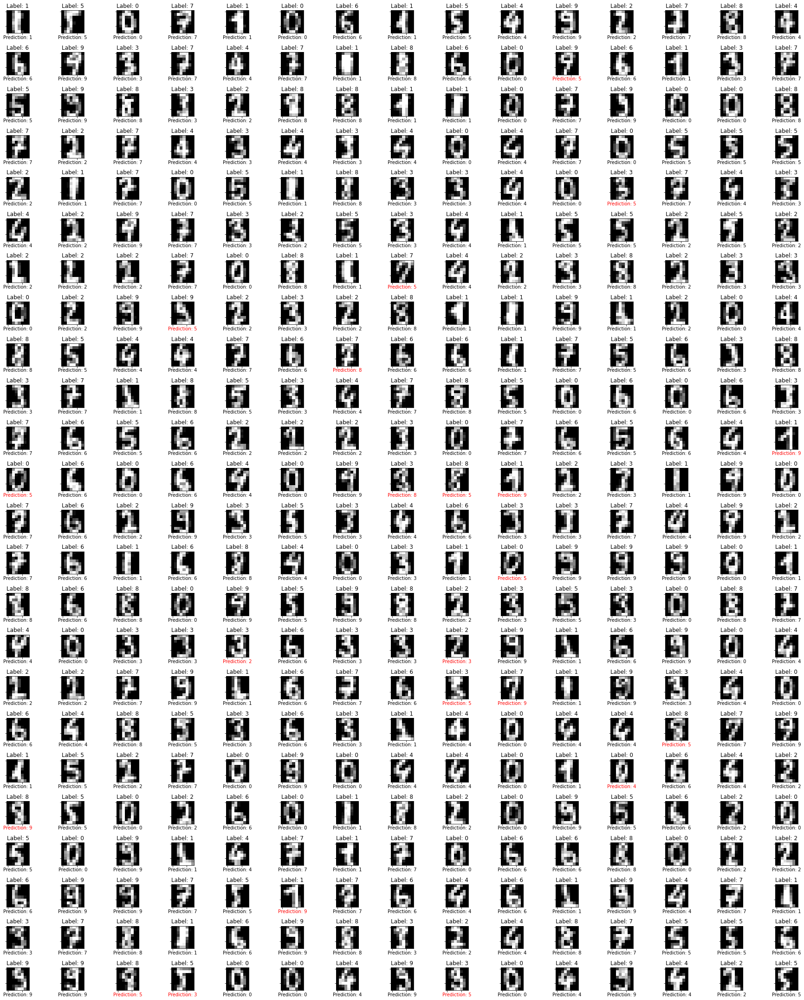

In [ ]:
r=24
c=15
counter=0
predictions=[]
fig, ax = plt.subplots(nrows=r, ncols=c, figsize=(25,30))
#fig.suptitle( "Testing", fontsize=20)
for i in range(r):
    for j in range(c):
       t1=X_testarr[:,counter]
       _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'S','S')
       prediction=np.argmax(Z3, 0)
       predictions.append(np.argmax(Z3, 0))
       t1=t1.reshape(8,8)
       ax[i,j].imshow(t1, cmap='gray')
       ax[i,j].set_title("Label: {}".format(y_testarr[counter]))
       ax[i,j].set_xlabel("Prediction: {}".format(predictions[counter]))
       if (predictions[counter]!=y_testarr[counter]):
          ax[i,j].xaxis.label.set_color('red')
       plt.setp(ax[i,j].get_xticklabels(), visible=False)#switch off the x axis
       plt.setp(ax[i,j].get_yticklabels(), visible=False)#switch off the y axis
       counter+=1
fig.tight_layout()
#fig.subplots_adjust(vspace=0.5)
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))


### **Relu and Relu**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],10,0.1,250,'R','R')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]


<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  1
prediction
[4, 7, 4, 4, 4, 4, 4, 4, 4, 4, 6, 4, 4, 4, 4, 6, 4, 4, 6, 6, 8, 4, 6, 8, 7, 8, 8, 4, 7, 7, 6, 8, 8, 8, 8, 7, 8, 6, 7, 8, 7, 7, 3, 0, 8, 8, 6, 7, 7, 3, 7, 7, 0, 3, 4, 7, 6, 7, 8, 3, 3, 3, 3, 7, 3, 7, 4, 7, 0, 0, 0, 7, 3, 4, 7, 8, 3, 3, 4, 4, 9, 8, 3, 4, 7, 8, 8, 7, 7, 7, 7, 9, 6, 7, 4, 7, 7, 3, 3, 8, 4, 3, 6, 8, 4, 8, 7, 7, 4, 7, 3, 7, 9, 8, 7, 3, 8, 3, 8, 3, 3, 4, 3, 4, 3, 3, 7, 4, 4, 4, 4, 7, 7, 4, 7, 7, 3, 3, 7, 4, 6, 6, 7, 6, 4, 4, 7, 4, 4, 7, 4, 3, 6, 4, 7, 3, 4, 7, 7, 7, 4, 4, 4, 4, 4, 4, 7, 4, 3, 4, 4, 3, 3, 4, 4, 4, 7, 4, 7, 4, 4, 3, 4, 4, 9, 4, 8, 4, 4, 4, 4, 4, 3, 7, 4, 4, 4, 4, 0, 4, 4, 4, 7, 4, 4, 7, 4, 7, 7, 4, 7, 4, 4, 7, 4, 4, 4, 4, 9, 7, 7, 4, 8, 4, 7, 7, 8, 7, 7, 7, 4, 7, 7, 4, 7, 7, 0, 4, 7, 4, 7, 7, 4, 4, 0, 7, 4, 7, 4, 4, 7, 7, 4, 7, 4, 7, 4, 0, 9, 7, 7, 4, 4, 4, 7, 4, 7, 7, 7, 4, 4, 7, 4, 7, 4, 7, 4, 7, 7, 4, 7, 9, 4, 7, 7, 9, 7, 4, 7, 4, 4, 4, 4, 4, 7, 4, 7, 4, 4, 7, 4, 4, 4, 4, 4, 7, 7, 7, 7, 7, 4, 4, 4, 4, 3, 4, 4, 4, 4, 8, 4, 8, 4, 4, 7,

<ipython-input-139-66e725649680>:18: RuntimeWarning: overflow encountered in exp
  e=np.exp(-S)


Iteration:  67
prediction
[0, 9, 0, 0, 2, 0, 0, 0, 5, 0, 7, 1, 9, 2, 0, 1, 0, 0, 0, 7, 0, 0, 0, 9, 3, 3, 3, 3, 3, 3, 7, 0, 2, 3, 3, 3, 3, 3, 1, 3, 3, 3, 0, 0, 3, 3, 3, 3, 3, 3, 3, 3, 0, 0, 3, 0, 1, 3, 3, 0, 3, 0, 3, 0, 3, 3, 1, 0, 0, 0, 1, 3, 0, 3, 3, 3, 0, 3, 3, 0, 0, 3, 0, 5, 7, 3, 3, 7, 3, 3, 3, 0, 1, 7, 1, 0, 3, 0, 0, 3, 0, 0, 0, 3, 5, 3, 3, 3, 0, 1, 0, 3, 1, 3, 3, 3, 3, 0, 3, 0, 0, 3, 0, 0, 3, 3, 3, 0, 0, 3, 0, 3, 3, 0, 7, 3, 0, 0, 7, 8, 0, 1, 2, 1, 1, 0, 7, 3, 0, 3, 2, 0, 1, 5, 9, 5, 0, 0, 3, 3, 3, 5, 0, 1, 0, 5, 2, 3, 9, 5, 1, 7, 7, 0, 0, 1, 7, 0, 3, 0, 0, 0, 0, 9, 0, 0, 3, 1, 0, 0, 0, 1, 0, 0, 1, 5, 2, 5, 0, 2, 5, 0, 7, 2, 3, 3, 2, 0, 0, 1, 9, 0, 3, 7, 1, 1, 1, 1, 8, 3, 3, 0, 9, 1, 7, 1, 2, 7, 0, 0, 0, 3, 1, 0, 1, 0, 0, 0, 3, 0, 9, 1, 5, 0, 0, 3, 0, 3, 0, 9, 0, 9, 1, 7, 5, 9, 0, 0, 3, 2, 3, 2, 5, 0, 7, 0, 0, 3, 1, 2, 7, 0, 0, 3, 2, 5, 5, 7, 3, 0, 1, 1, 0, 0, 2, 0, 3, 1, 3, 0, 0, 0, 0, 0, 5, 5, 2, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 3, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 5, 0, 0, 9

<ipython-input-139-66e725649680>:18: RuntimeWarning: overflow encountered in exp
  e=np.exp(-S)


Accuracy:40.55555555555556 %


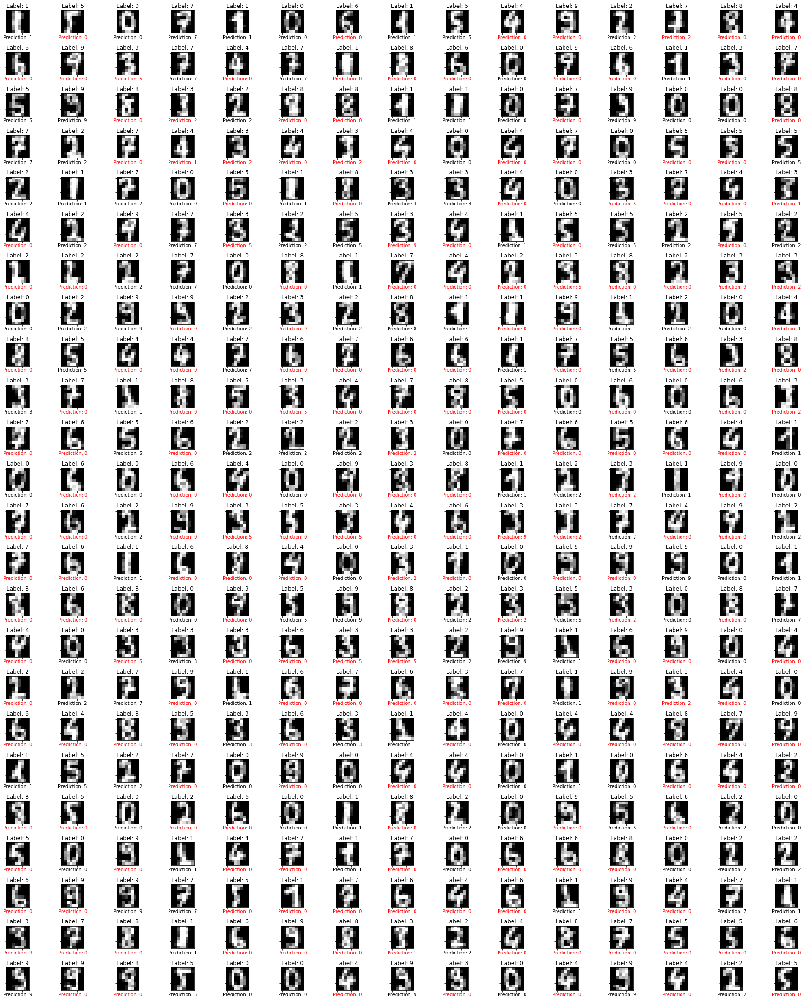

In [ ]:
r=24
c=15
counter=0
predictions=[]
fig, ax = plt.subplots(nrows=r, ncols=c, figsize=(25,30))
#fig.suptitle( "Testing", fontsize=20)
for i in range(r):
    for j in range(c):
       t1=X_testarr[:,counter]
       _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'R','R')
       prediction=np.argmax(Z3, 0)
       predictions.append(np.argmax(Z3, 0))
       t1=t1.reshape(8,8)
       ax[i,j].imshow(t1, cmap='gray')
       ax[i,j].set_title("Label: {}".format(y_testarr[counter]))
       ax[i,j].set_xlabel("Prediction: {}".format(predictions[counter]))
       if (predictions[counter]!=y_testarr[counter]):
          ax[i,j].xaxis.label.set_color('red')
       plt.setp(ax[i,j].get_xticklabels(), visible=False)#switch off the x axis
       plt.setp(ax[i,j].get_yticklabels(), visible=False)#switch off the y axis
       counter+=1
fig.tight_layout()
#fig.subplots_adjust(vspace=0.5)
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))


###**Sigmoid and Relu**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],10,0.1,250,'S','R')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]


<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  1
prediction
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5, 5, 5, 5, 7, 0, 0, 9, 9, 1, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 0, 0, 3, 3, 7, 9, 9, 9, 9, 9, 9, 9, 9, 1, 7, 7, 7, 7, 7, 9, 9, 5, 9, 9, 9, 5, 0, 5, 5, 5, 5, 3, 9, 0, 0, 0, 0, 0, 9, 9, 9, 9, 9, 9, 7, 7, 3, 3, 3, 3, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 6, 6, 3, 6, 6, 6, 6, 4, 4, 4, 4, 4, 4, 7, 7, 7, 3, 3, 3, 4, 4, 4, 9, 4, 4, 4, 3, 3, 3, 3, 3, 4, 4, 4, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 9, 9, 9, 9, 9, 9, 9, 9, 9, 4, 4, 1, 9, 9, 1, 1, 1, 1, 1, 0, 5, 5, 5, 5, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 7, 7, 7, 9, 1, 1, 4, 4, 4, 4, 4, 4, 9, 9, 9, 4, 4, 4, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 7, 9, 9, 9, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 9, 9, 9, 9, 4, 4, 4, 5, 3, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 3, 3, 3, 5, 8, 8, 5, 8, 8, 8, 8, 8, 8, 8, 8, 8, 5,

Accuracy:93.05555555555556 %


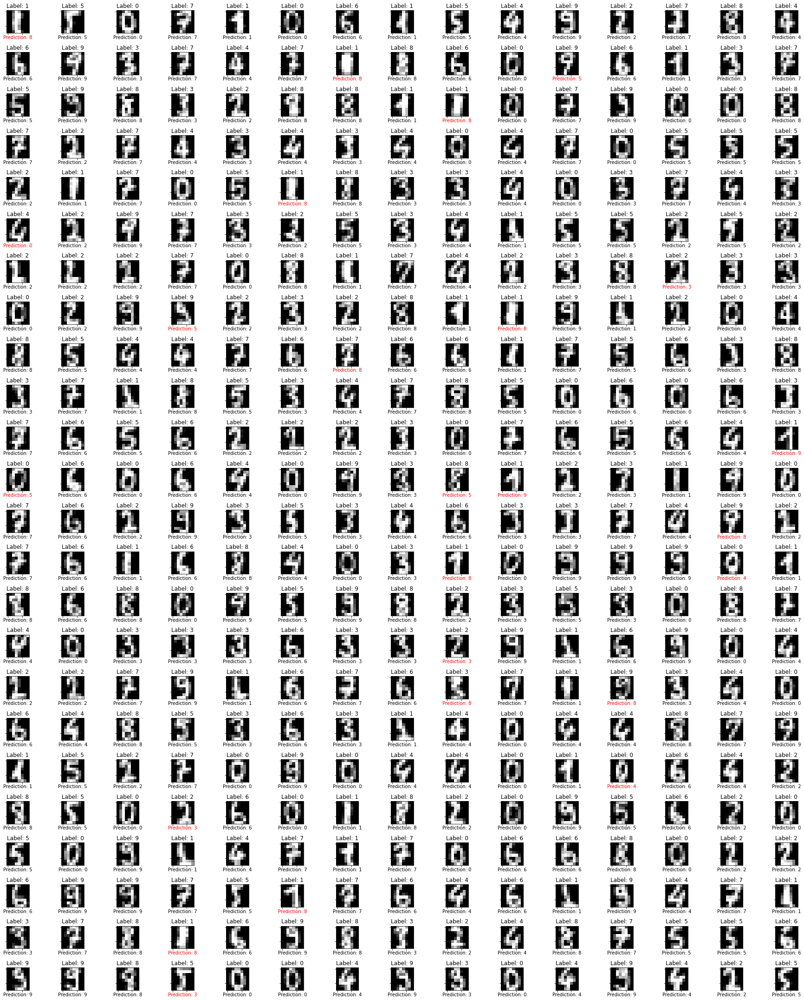

In [ ]:
r=24
c=15
counter=0
predictions=[]
fig, ax = plt.subplots(nrows=r, ncols=c, figsize=(25,30))
#fig.suptitle( "Testing", fontsize=20)
for i in range(r):
    for j in range(c):
       t1=X_testarr[:,counter]
       _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'S','R')
       prediction=np.argmax(Z3, 0)
       predictions.append(np.argmax(Z3, 0))
       t1=t1.reshape(8,8)
       ax[i,j].imshow(t1, cmap='gray')
       ax[i,j].set_title("Label: {}".format(y_testarr[counter]))
       ax[i,j].set_xlabel("Prediction: {}".format(predictions[counter]))
       if (predictions[counter]!=y_testarr[counter]):
          ax[i,j].xaxis.label.set_color('red')
       plt.setp(ax[i,j].get_xticklabels(), visible=False)#switch off the x axis
       plt.setp(ax[i,j].get_yticklabels(), visible=False)#switch off the y axis
       counter+=1
fig.tight_layout()
#fig.subplots_adjust(vspace=0.5)
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))


### **Relu and Sigmoid**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],10,0.1,250,'R','S')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]


<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  1
prediction
[5, 1, 0, 0, 4, 4, 1, 1, 4, 0, 1, 0, 4, 4, 0, 1, 0, 1, 1, 1, 1, 1, 0, 9, 9, 9, 9, 9, 9, 1, 7, 1, 3, 9, 1, 9, 9, 0, 1, 9, 1, 9, 1, 9, 7, 9, 3, 7, 9, 9, 7, 9, 3, 0, 9, 9, 1, 7, 9, 0, 7, 0, 9, 9, 7, 9, 9, 9, 7, 9, 9, 9, 9, 9, 7, 9, 0, 0, 7, 0, 0, 9, 0, 7, 7, 9, 9, 7, 3, 7, 3, 9, 9, 7, 7, 6, 3, 7, 7, 9, 7, 0, 0, 7, 7, 9, 7, 3, 0, 3, 3, 7, 9, 3, 7, 3, 3, 3, 3, 3, 3, 5, 5, 5, 3, 3, 3, 7, 6, 7, 4, 9, 9, 4, 7, 3, 6, 9, 7, 4, 6, 3, 4, 7, 9, 6, 7, 3, 6, 7, 7, 7, 4, 7, 9, 9, 9, 4, 9, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 7, 7, 4, 4, 4, 7, 7, 4, 4, 3, 4, 0, 9, 4, 0, 3, 9, 4, 4, 9, 9, 3, 9, 7, 9, 7, 9, 0, 7, 7, 4, 7, 5, 5, 9, 4, 1, 3, 1, 9, 4, 9, 7, 7, 1, 1, 1, 4, 3, 1, 7, 9, 1, 7, 1, 1, 7, 7, 7, 7, 7, 7, 1, 9, 9, 1, 7, 9, 1, 9, 9, 9, 7, 1, 7, 7, 3, 4, 3, 7, 9, 1, 7, 7, 9, 1, 9, 7, 1, 9, 7, 5, 5, 7, 4, 7, 9, 7, 7, 7, 9, 4, 9, 7, 7, 7, 7, 9, 4, 7, 7, 4, 7, 7, 4, 9, 7, 9, 9, 4, 7, 7, 7, 9, 7, 3, 7, 4, 4, 4, 7, 5, 4, 4, 4, 7, 7, 9, 7, 5, 1, 5, 9, 5, 4, 0, 4, 4, 7, 4, 9, 0, 6, 5,

<ipython-input-139-66e725649680>:18: RuntimeWarning: overflow encountered in exp
  e=np.exp(-S)


Iteration:  71
prediction
[0, 9, 0, 4, 2, 6, 0, 0, 5, 0, 2, 2, 3, 2, 0, 2, 0, 2, 2, 7, 2, 0, 0, 3, 3, 3, 2, 2, 5, 2, 2, 0, 2, 3, 2, 2, 2, 2, 1, 9, 2, 3, 0, 0, 2, 3, 2, 7, 2, 2, 2, 2, 0, 4, 5, 4, 1, 2, 3, 0, 5, 4, 0, 0, 5, 2, 1, 4, 0, 0, 4, 3, 4, 2, 2, 2, 0, 2, 0, 2, 0, 2, 4, 5, 2, 2, 3, 2, 2, 5, 2, 6, 1, 0, 1, 0, 2, 0, 2, 2, 5, 4, 0, 2, 5, 3, 3, 3, 0, 2, 0, 7, 6, 2, 3, 2, 2, 0, 2, 6, 0, 5, 0, 4, 2, 2, 2, 0, 0, 2, 0, 2, 3, 0, 7, 3, 6, 4, 2, 2, 4, 1, 2, 1, 1, 0, 2, 3, 0, 3, 2, 0, 1, 5, 2, 5, 4, 2, 3, 3, 3, 2, 0, 2, 4, 5, 2, 3, 2, 5, 4, 7, 7, 4, 0, 2, 2, 2, 2, 0, 2, 2, 0, 2, 2, 0, 3, 2, 4, 6, 0, 1, 2, 0, 1, 5, 2, 5, 0, 2, 5, 4, 2, 2, 2, 3, 2, 0, 2, 4, 2, 6, 3, 7, 1, 1, 1, 2, 2, 2, 2, 0, 2, 1, 2, 2, 2, 7, 2, 2, 4, 2, 0, 0, 1, 0, 0, 0, 3, 4, 2, 1, 5, 0, 0, 3, 0, 3, 2, 2, 2, 9, 1, 2, 5, 9, 2, 0, 2, 2, 2, 2, 5, 2, 2, 4, 0, 2, 2, 2, 2, 0, 4, 3, 2, 2, 5, 2, 3, 0, 1, 2, 6, 0, 2, 2, 3, 1, 3, 0, 0, 5, 4, 5, 3, 5, 3, 5, 6, 1, 0, 0, 0, 0, 2, 2, 2, 3, 2, 0, 5, 2, 2, 5, 2, 4, 0, 0, 2, 2, 4, 3, 0, 5, 3

<ipython-input-139-66e725649680>:18: RuntimeWarning: overflow encountered in exp
  e=np.exp(-S)


Accuracy:38.05555555555556 %


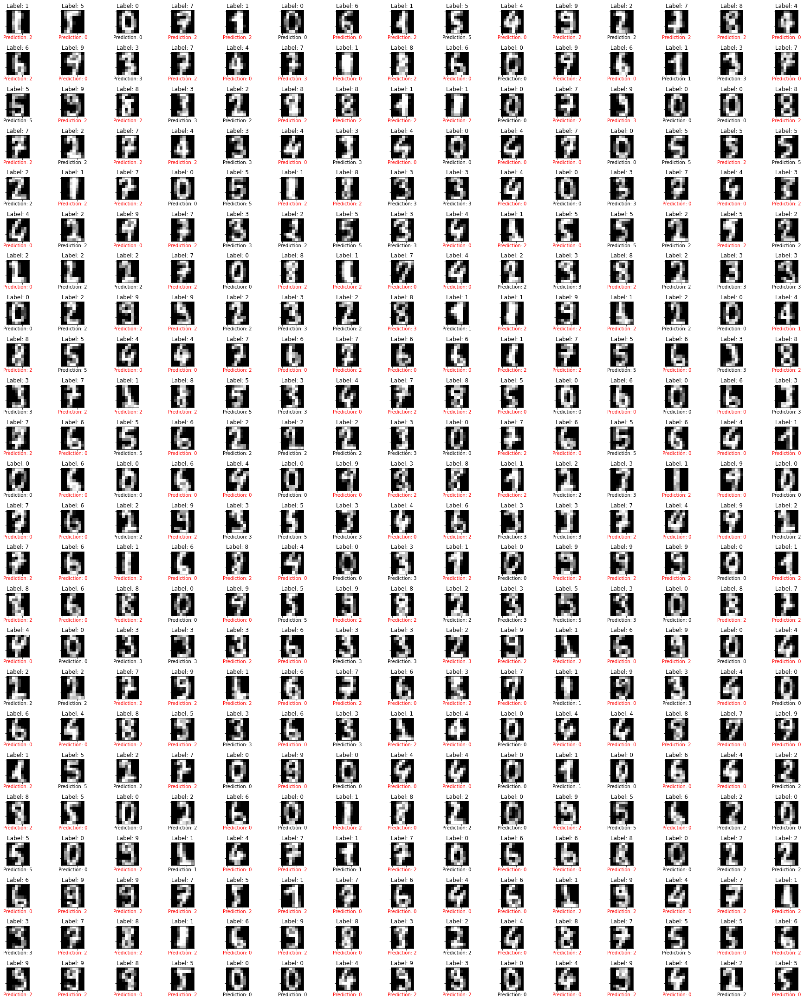

In [ ]:
r=24
c=15
counter=0
predictions=[]
fig, ax = plt.subplots(nrows=r, ncols=c, figsize=(25,30))
#fig.suptitle( "Testing", fontsize=20)
for i in range(r):
    for j in range(c):
       t1=X_testarr[:,counter]
       _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'R','S')
       prediction=np.argmax(Z3, 0)
       predictions.append(np.argmax(Z3, 0))
       t1=t1.reshape(8,8)
       ax[i,j].imshow(t1, cmap='gray')
       ax[i,j].set_title("Label: {}".format(y_testarr[counter]))
       ax[i,j].set_xlabel("Prediction: {}".format(predictions[counter]))
       if (predictions[counter]!=y_testarr[counter]):
          ax[i,j].xaxis.label.set_color('red')
       plt.setp(ax[i,j].get_xticklabels(), visible=False)#switch off the x axis
       plt.setp(ax[i,j].get_yticklabels(), visible=False)#switch off the y axis
       counter+=1
fig.tight_layout()
#fig.subplots_adjust(vspace=0.5)
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))


### **Sigmoid and tanh**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],10,0.1,250,'S','T')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]


<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  1
prediction
[0, 4, 4, 4, 4, 4, 4, 4, 0, 0, 0, 0, 0, 0, 2, 2, 1, 1, 9, 9, 9, 7, 7, 7, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 3, 3, 0, 0, 3, 3, 3, 3, 9, 9, 9, 9, 9, 9, 9, 1, 7, 7, 7, 7, 7, 9, 9, 9, 9, 9, 9, 5, 5, 4, 4, 4, 4, 4, 4, 0, 4, 0, 0, 4, 9, 4, 4, 4, 4, 3, 7, 7, 3, 3, 3, 3, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 4, 4, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 6, 3, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 6, 6, 3, 6, 6, 6, 6, 4, 4, 4, 4, 4, 4, 7, 7, 7, 3, 3, 3, 4, 4, 4, 9, 4, 4, 3, 3, 3, 3, 3, 3, 4, 4, 4, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 4, 1, 9, 9, 1, 1, 1, 5, 1, 5, 5, 5, 5, 5, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 7, 7, 7, 9, 1, 1, 4, 4, 4, 4, 4, 4, 4, 4, 9, 4, 4, 4, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 7, 9, 9, 9, 7, 7, 7, 7, 2, 2, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 9, 9, 9, 9, 4, 4, 4, 5, 3, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 3, 3, 3, 5, 8, 8, 5, 8, 8, 8, 8, 8, 8, 8, 8, 8, 5,

Accuracy:93.05555555555556 %


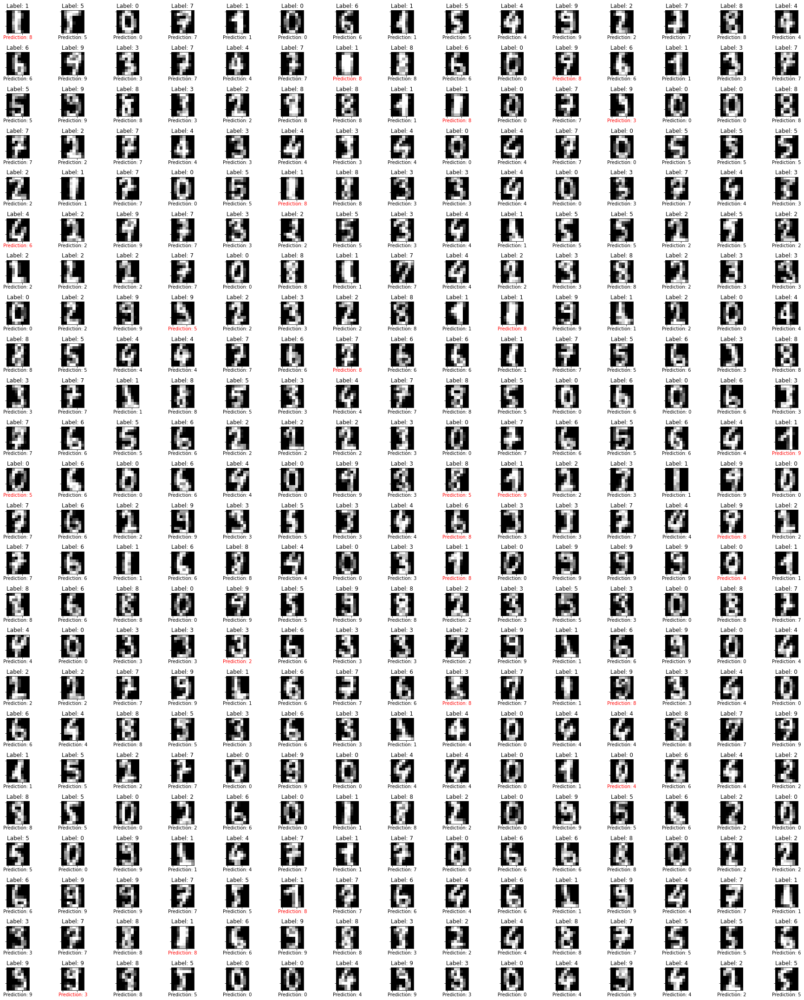

In [ ]:
r=24
c=15
counter=0
predictions=[]
fig, ax = plt.subplots(nrows=r, ncols=c, figsize=(25,30))
#fig.suptitle( "Testing", fontsize=20)
for i in range(r):
    for j in range(c):
       t1=X_testarr[:,counter]
       _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'S','T')
       prediction=np.argmax(Z3, 0)
       predictions.append(np.argmax(Z3, 0))
       t1=t1.reshape(8,8)
       ax[i,j].imshow(t1, cmap='gray')
       ax[i,j].set_title("Label: {}".format(y_testarr[counter]))
       ax[i,j].set_xlabel("Prediction: {}".format(predictions[counter]))
       if (predictions[counter]!=y_testarr[counter]):
          ax[i,j].xaxis.label.set_color('red')
       plt.setp(ax[i,j].get_xticklabels(), visible=False)#switch off the x axis
       plt.setp(ax[i,j].get_yticklabels(), visible=False)#switch off the y axis
       counter+=1
fig.tight_layout()
#fig.subplots_adjust(vspace=0.5)
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))


### **tanh and tanh**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],10,0.1,250,'T','T')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]


<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  1
prediction
[5, 8, 4, 4, 0, 4, 5, 4, 5, 4, 8, 5, 2, 2, 5, 6, 5, 2, 8, 5, 5, 5, 4, 0, 2, 1, 1, 2, 6, 8, 8, 5, 0, 2, 9, 2, 2, 8, 8, 2, 8, 2, 5, 1, 5, 0, 3, 8, 0, 3, 2, 9, 0, 4, 0, 8, 9, 0, 3, 4, 5, 4, 2, 7, 5, 0, 4, 4, 5, 0, 4, 0, 4, 1, 9, 0, 5, 3, 5, 9, 4, 0, 4, 5, 5, 4, 3, 8, 7, 3, 8, 4, 4, 8, 7, 0, 3, 4, 5, 8, 7, 4, 5, 3, 5, 5, 2, 3, 5, 8, 5, 5, 4, 5, 3, 4, 3, 5, 3, 4, 4, 5, 5, 4, 2, 5, 2, 4, 5, 2, 4, 2, 3, 4, 5, 3, 4, 4, 7, 3, 4, 4, 7, 4, 1, 4, 3, 2, 4, 3, 2, 7, 4, 5, 3, 3, 4, 8, 3, 3, 3, 3, 4, 4, 4, 5, 3, 3, 3, 5, 4, 4, 4, 4, 4, 4, 7, 5, 8, 4, 8, 4, 5, 3, 8, 7, 3, 3, 4, 4, 7, 1, 8, 0, 1, 1, 3, 5, 0, 3, 5, 4, 4, 1, 2, 3, 2, 1, 8, 4, 3, 4, 9, 8, 1, 1, 1, 2, 1, 8, 1, 5, 0, 1, 5, 1, 2, 8, 7, 5, 4, 2, 1, 5, 4, 0, 0, 5, 9, 4, 0, 4, 1, 4, 0, 1, 4, 3, 3, 3, 4, 3, 4, 3, 5, 9, 4, 0, 3, 2, 9, 2, 5, 7, 7, 4, 4, 9, 1, 2, 5, 0, 4, 9, 2, 7, 5, 7, 9, 4, 1, 2, 4, 4, 2, 2, 3, 4, 9, 0, 4, 5, 4, 5, 3, 5, 3, 5, 4, 1, 4, 4, 0, 4, 2, 1, 4, 3, 3, 7, 5, 5, 2, 5, 5, 4, 5, 4, 8, 2, 4, 3, 0, 6, 3,

Accuracy:98.05555555555556 %


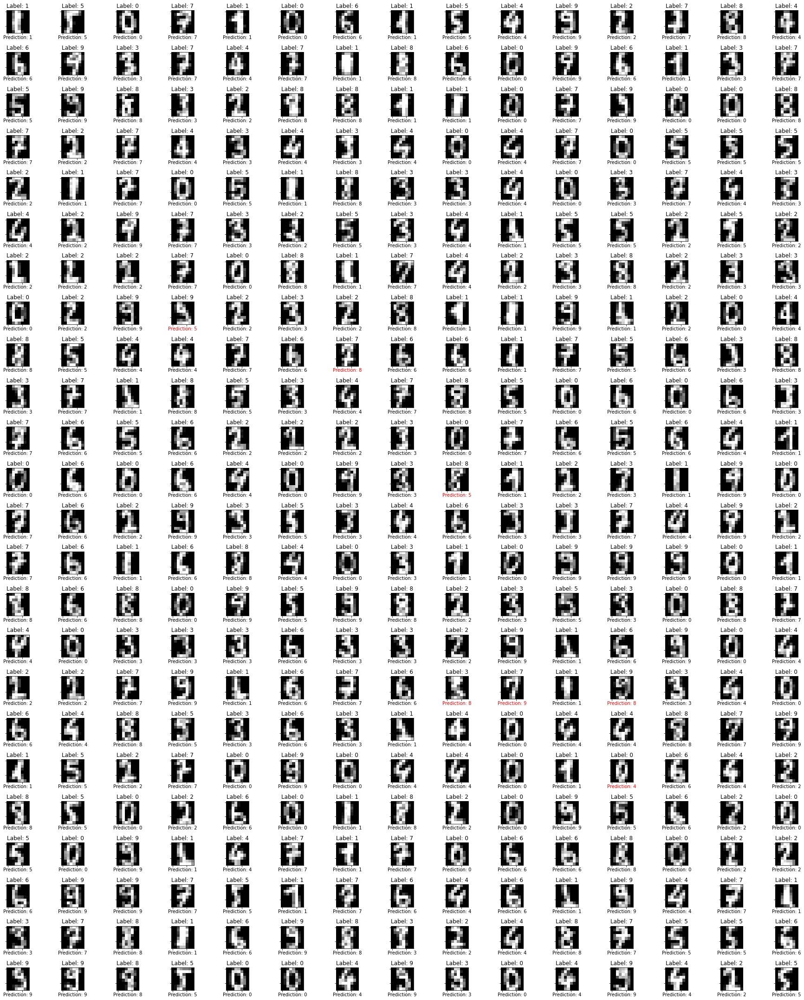

In [ ]:
r=24
c=15
counter=0
predictions=[]
fig, ax = plt.subplots(nrows=r, ncols=c, figsize=(25,30))
#fig.suptitle( "Testing", fontsize=20)
for i in range(r):
    for j in range(c):
       t1=X_testarr[:,counter]
       _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'T','T')
       prediction=np.argmax(Z3, 0)
       predictions.append(np.argmax(Z3, 0))
       t1=t1.reshape(8,8)
       ax[i,j].imshow(t1, cmap='gray')
       ax[i,j].set_title("Label: {}".format(y_testarr[counter]))
       ax[i,j].set_xlabel("Prediction: {}".format(predictions[counter]))
       if (predictions[counter]!=y_testarr[counter]):
          ax[i,j].xaxis.label.set_color('red')
       plt.setp(ax[i,j].get_xticklabels(), visible=False)#switch off the x axis
       plt.setp(ax[i,j].get_yticklabels(), visible=False)#switch off the y axis
       counter+=1
fig.tight_layout()
#fig.subplots_adjust(vspace=0.5)
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))


### **tanh and Sigmoid**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],10,0.1,250,'T','S')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]


<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  1
prediction
[8, 0, 6, 6, 4, 4, 4, 4, 4, 6, 4, 6, 4, 0, 2, 2, 3, 4, 5, 4, 5, 0, 6, 4, 5, 5, 9, 9, 4, 1, 7, 9, 6, 9, 0, 0, 2, 2, 2, 9, 2, 4, 9, 9, 3, 9, 8, 3, 0, 0, 7, 7, 7, 9, 9, 9, 3, 7, 9, 6, 7, 6, 7, 0, 5, 9, 3, 6, 5, 0, 6, 9, 0, 5, 2, 9, 0, 4, 5, 0, 0, 9, 0, 3, 7, 5, 9, 7, 2, 5, 7, 6, 6, 7, 3, 0, 8, 3, 7, 7, 5, 6, 3, 3, 5, 9, 7, 9, 3, 6, 4, 5, 6, 7, 5, 6, 2, 5, 2, 6, 6, 5, 5, 6, 4, 5, 4, 7, 0, 3, 6, 9, 9, 6, 7, 9, 6, 6, 7, 6, 6, 6, 2, 2, 6, 4, 7, 9, 0, 9, 2, 7, 6, 5, 9, 9, 4, 2, 9, 9, 9, 3, 4, 4, 4, 4, 2, 9, 9, 3, 4, 7, 7, 4, 4, 2, 7, 7, 4, 0, 7, 4, 0, 9, 9, 0, 9, 9, 4, 6, 9, 1, 4, 0, 7, 9, 9, 5, 0, 3, 5, 4, 5, 2, 2, 9, 2, 2, 2, 4, 9, 6, 9, 7, 7, 2, 4, 2, 6, 4, 2, 2, 9, 1, 7, 7, 1, 7, 1, 7, 7, 7, 4, 0, 8, 9, 9, 7, 9, 4, 9, 9, 9, 7, 0, 7, 4, 9, 4, 9, 7, 9, 4, 7, 9, 9, 7, 0, 2, 7, 9, 9, 5, 2, 7, 4, 4, 9, 2, 2, 7, 9, 4, 9, 2, 7, 5, 7, 9, 4, 7, 2, 6, 7, 7, 2, 9, 4, 9, 0, 6, 5, 7, 5, 9, 5, 9, 5, 6, 2, 6, 4, 0, 6, 2, 6, 7, 5, 9, 6, 5, 5, 2, 9, 5, 4, 0, 6, 2, 7, 4, 9, 0, 6, 9,

Accuracy:98.05555555555556 %


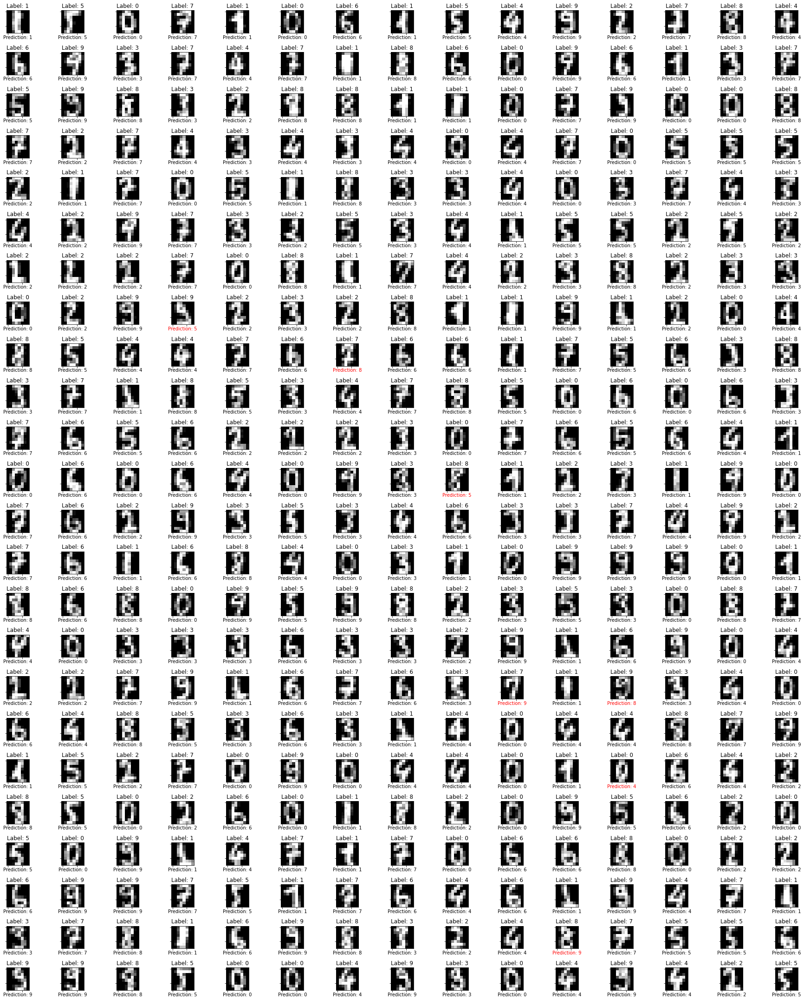

In [ ]:
r=24
c=15
counter=0
predictions=[]
fig, ax = plt.subplots(nrows=r, ncols=c, figsize=(25,30))
#fig.suptitle( "Testing", fontsize=20)
for i in range(r):
    for j in range(c):
       t1=X_testarr[:,counter]
       _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'T','S')
       prediction=np.argmax(Z3, 0)
       predictions.append(np.argmax(Z3, 0))
       t1=t1.reshape(8,8)
       ax[i,j].imshow(t1, cmap='gray')
       ax[i,j].set_title("Label: {}".format(y_testarr[counter]))
       ax[i,j].set_xlabel("Prediction: {}".format(predictions[counter]))
       if (predictions[counter]!=y_testarr[counter]):
          ax[i,j].xaxis.label.set_color('red')
       plt.setp(ax[i,j].get_xticklabels(), visible=False)#switch off the x axis
       plt.setp(ax[i,j].get_yticklabels(), visible=False)#switch off the y axis
       counter+=1
fig.tight_layout()
#fig.subplots_adjust(vspace=0.5)
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))


### **tanh and Relu**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],10,0.1,250,'T','R')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]


<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  1
prediction
[6, 2, 0, 6, 0, 6, 0, 0, 0, 0, 7, 0, 0, 0, 7, 0, 7, 9, 2, 7, 7, 0, 0, 9, 9, 0, 9, 9, 9, 7, 7, 7, 7, 9, 9, 9, 7, 6, 7, 9, 7, 9, 9, 0, 7, 9, 3, 7, 9, 9, 7, 7, 7, 7, 9, 6, 0, 7, 9, 0, 5, 6, 7, 0, 5, 9, 9, 7, 5, 0, 5, 9, 6, 0, 7, 0, 0, 3, 4, 0, 0, 9, 6, 5, 7, 9, 9, 7, 7, 5, 3, 6, 6, 7, 7, 7, 7, 7, 7, 9, 5, 6, 5, 0, 5, 9, 9, 9, 3, 4, 5, 5, 6, 3, 7, 6, 3, 5, 3, 6, 7, 5, 5, 6, 9, 7, 9, 5, 6, 2, 6, 9, 9, 6, 7, 6, 6, 6, 7, 6, 4, 4, 3, 4, 6, 6, 7, 9, 0, 3, 3, 7, 6, 5, 9, 9, 4, 9, 9, 3, 9, 6, 6, 4, 4, 5, 4, 3, 9, 4, 4, 7, 7, 4, 4, 4, 7, 4, 3, 0, 4, 6, 0, 9, 3, 0, 0, 9, 4, 6, 9, 2, 9, 0, 4, 9, 0, 5, 0, 9, 5, 4, 5, 0, 0, 3, 2, 4, 5, 4, 9, 6, 9, 7, 4, 4, 4, 5, 3, 7, 3, 5, 9, 4, 7, 7, 2, 7, 9, 7, 7, 7, 4, 0, 9, 9, 0, 7, 9, 4, 9, 9, 5, 7, 0, 7, 4, 3, 3, 9, 7, 9, 4, 7, 5, 9, 4, 0, 3, 7, 9, 9, 5, 5, 7, 4, 7, 9, 7, 2, 7, 0, 4, 9, 2, 7, 5, 7, 9, 4, 4, 9, 6, 7, 2, 0, 9, 4, 9, 9, 6, 5, 4, 5, 9, 5, 3, 5, 6, 4, 6, 4, 0, 6, 5, 6, 7, 3, 9, 7, 5, 5, 3, 9, 5, 4, 0, 6, 5, 3, 4, 3, 0, 6, 3,

Accuracy:97.5 %


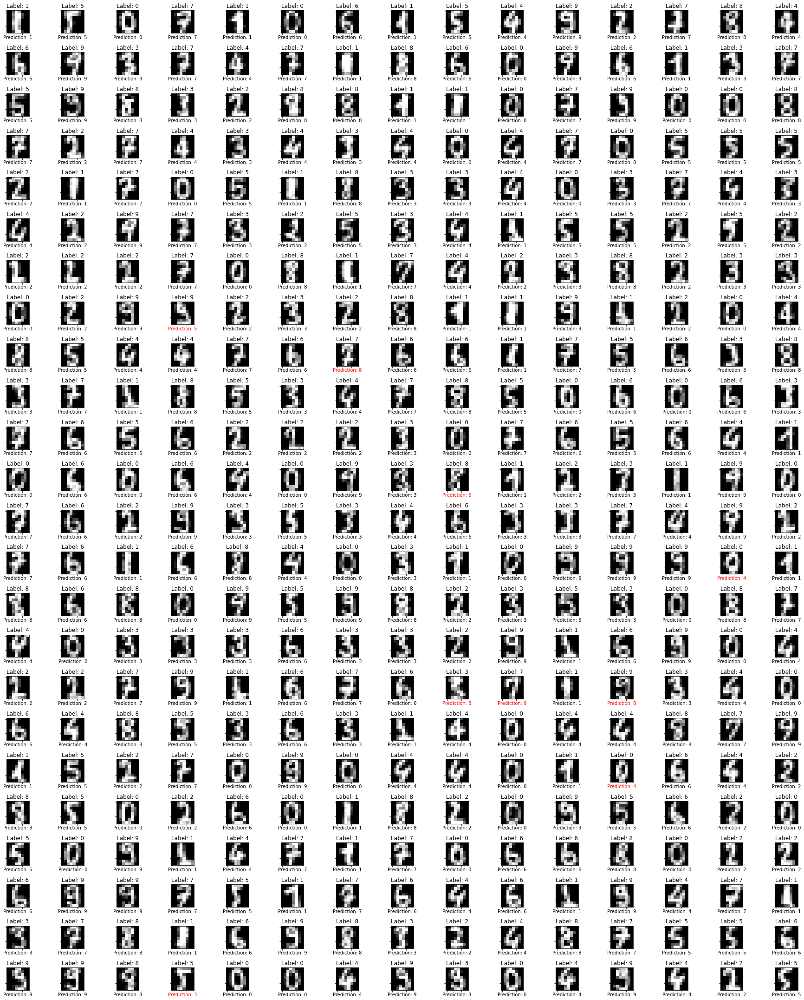

In [ ]:
r=24
c=15
counter=0
predictions=[]
fig, ax = plt.subplots(nrows=r, ncols=c, figsize=(25,30))
#fig.suptitle( "Testing", fontsize=20)
for i in range(r):
    for j in range(c):
       t1=X_testarr[:,counter]
       _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'T','R')
       prediction=np.argmax(Z3, 0)
       predictions.append(np.argmax(Z3, 0))
       t1=t1.reshape(8,8)
       ax[i,j].imshow(t1, cmap='gray')
       ax[i,j].set_title("Label: {}".format(y_testarr[counter]))
       ax[i,j].set_xlabel("Prediction: {}".format(predictions[counter]))
       if (predictions[counter]!=y_testarr[counter]):
          ax[i,j].xaxis.label.set_color('red')
       plt.setp(ax[i,j].get_xticklabels(), visible=False)#switch off the x axis
       plt.setp(ax[i,j].get_yticklabels(), visible=False)#switch off the y axis
       counter+=1
fig.tight_layout()
#fig.subplots_adjust(vspace=0.5)
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))


### **Relu and tanh**

In [ ]:
W1,W2,W3=gradient_descent(X_train, y_train,X_train.shape[0],X_train.shape[1],2*X_train.shape[0],2*X_train.shape[0],10,0.1,250,'R','T')

Iteration:  0
prediction
[]
Accuracy=
0.0
[]


<ipython-input-144-20aa3869ac73>:11: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  print((np.sum(predictions == Y) / Y.size)*100)


Iteration:  1
prediction
[3, 4, 9, 7, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 9, 4, 4, 9, 9, 9, 9, 7, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 7, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 7, 9, 3, 9, 7, 9, 7, 9, 4, 9, 3, 9, 9, 3, 9, 7, 7, 4, 9, 7, 9, 3, 4, 9, 9, 9, 9, 4, 9, 9, 9, 9, 9, 9, 9, 9, 9, 7, 4, 9, 7, 7, 7, 7, 9, 7, 4, 7, 9, 4, 3, 4, 7, 4, 9, 9, 9, 5, 7, 9, 7, 7, 9, 9, 7, 7, 3, 3, 3, 3, 3, 3, 4, 4, 4, 9, 4, 4, 4, 4, 9, 9, 9, 4, 9, 4, 4, 7, 9, 7, 7, 4, 4, 4, 4, 4, 9, 9, 9, 4, 4, 7, 3, 3, 9, 3, 4, 3, 9, 9, 3, 3, 4, 4, 3, 4, 9, 9, 4, 3, 4, 7, 4, 4, 4, 4, 7, 4, 4, 4, 4, 9, 9, 9, 4, 9, 9, 3, 4, 3, 3, 9, 3, 4, 9, 9, 3, 3, 9, 3, 4, 4, 4, 4, 9, 3, 4, 9, 4, 3, 4, 9, 4, 4, 4, 4, 9, 9, 9, 9, 1, 9, 1, 9, 1, 9, 7, 3, 7, 1, 9, 7, 9, 4, 9, 9, 1, 9, 4, 9, 9, 9, 4, 9, 9, 4, 9, 9, 9, 4, 9, 7, 7, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 7, 7, 7, 9, 7, 7, 7, 9, 4, 9, 9, 7, 9, 7, 9, 9, 7, 7, 9, 4, 9, 9, 9, 7, 9, 9, 9, 7, 4, 4, 9, 7, 9, 5, 4, 4, 4, 4, 9, 4, 9, 7, 4, 9, 9, 9, 7, 7, 9, 9, 4, 4, 4, 4, 9, 9, 4, 9, 4, 4, 9,

<ipython-input-139-66e725649680>:18: RuntimeWarning: overflow encountered in exp
  e=np.exp(-S)


Iteration:  112
prediction
[4, 0, 4, 4, 2, 0, 0, 0, 5, 0, 0, 2, 5, 2, 5, 2, 5, 0, 0, 0, 0, 0, 0, 2, 3, 2, 2, 2, 5, 8, 0, 0, 2, 2, 2, 0, 2, 2, 0, 2, 2, 3, 0, 0, 0, 2, 2, 2, 5, 5, 2, 2, 2, 4, 5, 4, 0, 0, 2, 0, 5, 4, 0, 0, 5, 2, 0, 4, 5, 0, 4, 2, 4, 2, 2, 0, 0, 2, 0, 0, 0, 2, 4, 5, 2, 0, 2, 0, 2, 5, 2, 0, 0, 0, 0, 0, 2, 4, 2, 2, 5, 4, 0, 2, 5, 2, 2, 2, 2, 0, 0, 2, 0, 2, 5, 0, 2, 0, 2, 0, 4, 5, 4, 4, 2, 0, 2, 0, 0, 2, 0, 2, 2, 0, 0, 2, 0, 4, 0, 2, 4, 0, 2, 0, 2, 0, 0, 2, 0, 2, 2, 0, 0, 5, 0, 5, 4, 2, 5, 2, 2, 0, 4, 0, 4, 5, 2, 2, 2, 5, 4, 2, 0, 4, 0, 2, 0, 0, 2, 0, 0, 2, 0, 5, 2, 0, 2, 0, 4, 0, 0, 2, 0, 0, 1, 5, 2, 5, 0, 2, 5, 4, 2, 2, 2, 2, 2, 0, 0, 4, 0, 0, 2, 0, 0, 0, 0, 2, 2, 0, 2, 5, 2, 0, 0, 0, 2, 0, 0, 0, 4, 2, 0, 0, 0, 0, 0, 0, 5, 4, 0, 0, 5, 4, 0, 2, 4, 3, 0, 2, 0, 0, 4, 2, 5, 2, 0, 0, 2, 2, 2, 2, 5, 5, 0, 4, 0, 2, 2, 2, 0, 0, 4, 2, 2, 0, 5, 2, 0, 0, 0, 2, 0, 0, 2, 0, 3, 4, 2, 0, 0, 5, 4, 5, 2, 5, 2, 5, 0, 0, 0, 4, 0, 0, 0, 0, 0, 3, 2, 0, 5, 0, 2, 5, 0, 4, 4, 4, 4, 2, 4, 2, 4, 0, 

<ipython-input-139-66e725649680>:18: RuntimeWarning: overflow encountered in exp
  e=np.exp(-S)


Accuracy:40.0 %


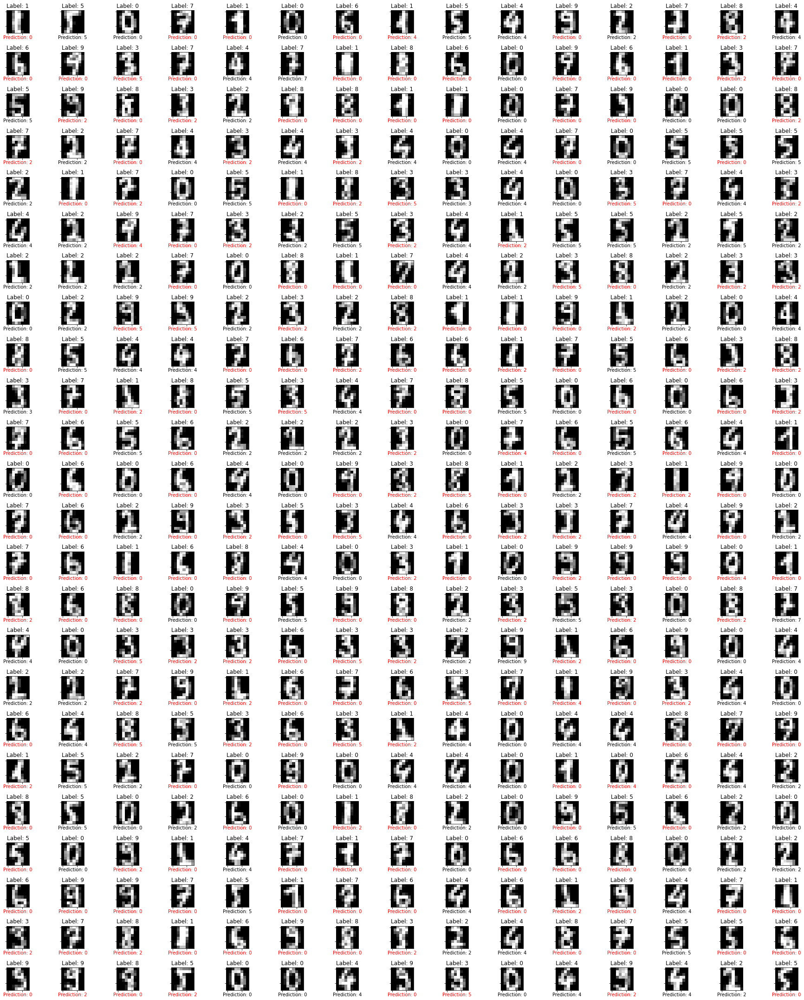

In [ ]:
r=24
c=15
counter=0
predictions=[]
fig, ax = plt.subplots(nrows=r, ncols=c, figsize=(25,30))
#fig.suptitle( "Testing", fontsize=20)
for i in range(r):
    for j in range(c):
       t1=X_testarr[:,counter]
       _,_,_,_,_,Z3=forwardPropagation(W1,W2,W3,t1,'R','T')
       prediction=np.argmax(Z3, 0)
       predictions.append(np.argmax(Z3, 0))
       t1=t1.reshape(8,8)
       ax[i,j].imshow(t1, cmap='gray')
       ax[i,j].set_title("Label: {}".format(y_testarr[counter]))
       ax[i,j].set_xlabel("Prediction: {}".format(predictions[counter]))
       if (predictions[counter]!=y_testarr[counter]):
          ax[i,j].xaxis.label.set_color('red')
       plt.setp(ax[i,j].get_xticklabels(), visible=False)#switch off the x axis
       plt.setp(ax[i,j].get_yticklabels(), visible=False)#switch off the y axis
       counter+=1
fig.tight_layout()
#fig.subplots_adjust(vspace=0.5)
prdictions=np.array(predictions).ravel()
print('Accuracy:{} %'.format((np.sum(predictions == y_testarr) / y_testarr.size)*100))


#**Conlusion**
Best Accuracy obtained when using tanh and tanh or tanh and sigmoid, respectively for the hidden layers.
Using tanh at the first hidden layer gives really appealing results.
tanh and relu also gives slightly lower but good accuracy